# Concepts

In [ ]:
* Relational databases
* Primary/secondary attributes
* DataJoint
* Object oriented programming
* Relational algebra

# Diagrams

In [1]:
import datajoint as dj
from churchland_pipeline_python import action, acquisition, equipment, lab, processing, reference

%load_ext autoreload
%autoreload 2

Connecting njm2149@datajoint.u19motor.zi.columbia.edu:3306


## Single diagrams

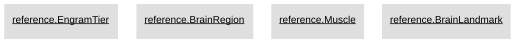

In [95]:
dj.Diagram(reference)

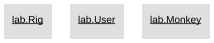

In [3]:
dj.ERD(lab)

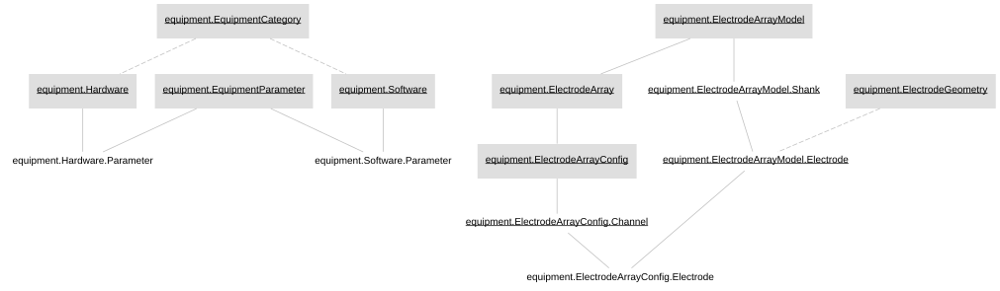

In [4]:
dj.ERD(equipment)

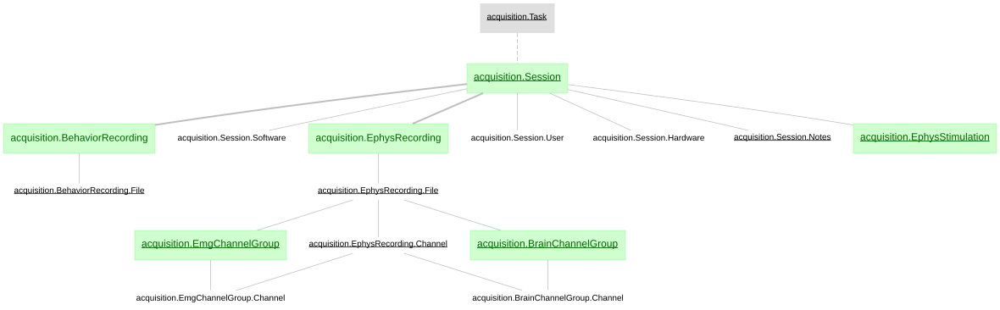

In [5]:
dj.ERD(acquisition)

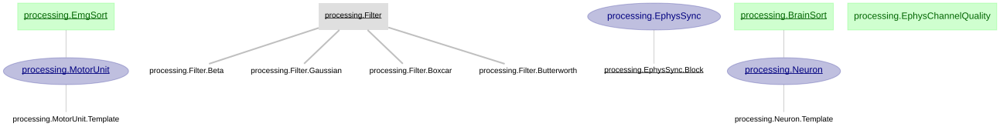

In [6]:
dj.ERD(processing)

## Linked diagrams

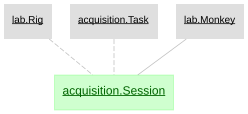

In [7]:
dj.ERD(acquisition.Session) - 1

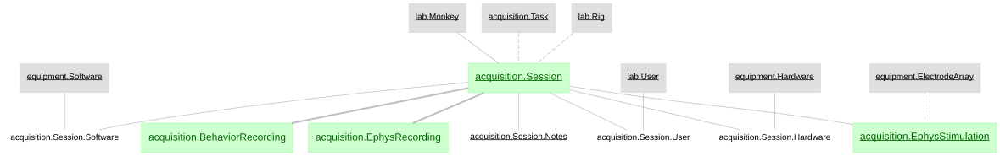

In [9]:
dj.ERD(acquisition.Session) + 1 - 1

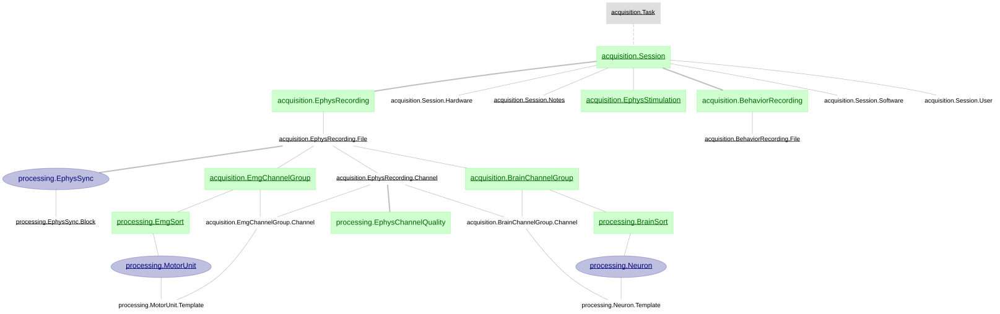

In [10]:
dj.ERD(acquisition) + dj.ERD(processing) - (dj.ERD(processing.Filter) + 1)

# Querying tables

In [17]:
# update display limit (default is 12)
dj.config['display.limit'] = 4

In [18]:
# recording sessions
acquisition.Session()

session_date session date,monkey monkey name,rig rig name,task task name,task_version task version,"session_problem session problem. If True, session is excluded from analyses","session_problem_description session problem description (e.g., corrupted data)"
2018-04-13,Cousteau,Jumanji,pacman,1.0,0,
2018-04-20,Cousteau,Jumanji,pacman,1.0,0,
2018-06-15,Cousteau,Jumanji,pacman,1.0,0,
2018-06-22,Cousteau,Jumanji,pacman,1.0,0,


In [19]:
# ephys recordings
acquisition.EphysRecording()

session_date session date,monkey monkey name,ephys_recording_sample_rate ephys sample rate (Hz),ephys_recording_duration ephys recording duration (s),ephys_recording_path path to ephys file directory
2018-04-13,Cousteau,30000,3612.464,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-04-13/blackrock/
2018-04-20,Cousteau,30000,3527.645,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-04-20/blackrock/
2018-06-15,Cousteau,30000,3818.977,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-06-15/blackrock/
2018-06-22,Cousteau,30000,2738.306,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-06-22/blackrock/


In [20]:
# ephys recording channels
acquisition.EphysRecording.Channel()

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,ephys_channel_idx channel index in data array,ephys_channel_id channel ID number used by Blackrock system,ephys_channel_type channel data type
2018-04-13,Cousteau,0,0,129,emg
2018-04-13,Cousteau,0,1,130,emg
2018-04-13,Cousteau,0,2,131,emg
2018-04-13,Cousteau,0,3,132,emg


In [21]:
# brain channel groups in ephys files
acquisition.BrainChannelGroup()

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,electrode_array_model electrode array model name,electrode_array_model_version electrode array model version,electrode_array_id electrode array ID number,chamber_id chamber ID number,burr_hole_id burr hole ID number,brain_hemisphere brain hemisphere,brain_channel_group_notes brain channel group notes,probe_depth depth of neural probe tip relative to cortical surface (mm),electrode_array_config_id electrode array configuration ID number
2019-08-13,Cousteau,0,M1,0,S-Probe,32 chan,0,0,0,right,,13.000,0
2019-08-14,Cousteau,0,M1,0,S-Probe,32 chan,0,0,0,right,,13.000,0
2019-08-15,Cousteau,0,M1,0,S-Probe,32 chan,0,0,0,right,,13.000,0
2019-08-19,Cousteau,0,M1,0,S-Probe,32 chan,0,0,0,right,,13.000,0


In [22]:
# spike-sorted neurons
processing.Neuron()

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,neuron_isolation neuron isolation quality (single- or multi-unit),neuron_spike_indices raw spike indices for the full recording
2019-08-13,Cousteau,0,M1,0,0,0,multi,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,1,single,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,2,single,=BLOB=
2019-08-13,Cousteau,0,M1,0,0,3,single,=BLOB=


# Relational algebra

## Restriction

In [23]:
# sessions with behavior and ephys recordings
acquisition.Session & acquisition.BehaviorRecording & acquisition.EphysRecording

session_date session date,monkey monkey name,rig rig name,task task name,task_version task version,"session_problem session problem. If True, session is excluded from analyses","session_problem_description session problem description (e.g., corrupted data)"
2018-04-13,Cousteau,Jumanji,pacman,1.0,0,
2018-04-20,Cousteau,Jumanji,pacman,1.0,0,
2018-06-15,Cousteau,Jumanji,pacman,1.0,0,
2018-06-22,Cousteau,Jumanji,pacman,1.0,0,


In [24]:
# sessions with behavior recording and without ephys recordings
acquisition.Session & acquisition.BehaviorRecording - acquisition.EphysRecording

session_date session date,monkey monkey name,rig rig name,task task name,task_version task version,"session_problem session problem. If True, session is excluded from analyses","session_problem_description session problem description (e.g., corrupted data)"
2018-07-12,Cousteau,Jumanji,pacman,1.0,0,


In [25]:
# neurons recorded with Neuropixels
processing.Neuron & (acquisition.BrainChannelGroup & {'electrode_array_model': 'Neuropixels'})

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,neuron_isolation neuron isolation quality (single- or multi-unit),neuron_spike_indices raw spike indices for the full recording
2019-11-22,Cousteau,0,M1,0,0,0,single,=BLOB=
2019-11-22,Cousteau,0,M1,0,0,1,single,=BLOB=
2019-11-22,Cousteau,0,M1,0,0,2,single,=BLOB=
2019-11-22,Cousteau,0,M1,0,0,3,single,=BLOB=


In [26]:
# sessions with sorted neurons and motor units
acquisition.Session & processing.Neuron & processing.MotorUnit

session_date session date,monkey monkey name,rig rig name,task task name,task_version task version,"session_problem session problem. If True, session is excluded from analyses","session_problem_description session problem description (e.g., corrupted data)"
2019-12-16,Cousteau,Jumanji,pacman,1.0,0,
2020-01-06,Cousteau,Jumanji,pacman,1.0,0,
2020-01-08,Cousteau,Jumanji,pacman,1.0,0,


In [27]:
# neurons from sessions with motor units
processing.Neuron & processing.MotorUnit

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,brain_region_abbr brain region abbreviation,brain_channel_group_id brain channel group ID number,brain_sort_id brain sort ID number,neuron_id neuron ID number,neuron_isolation neuron isolation quality (single- or multi-unit),neuron_spike_indices raw spike indices for the full recording
2019-12-16,Cousteau,0,M1,0,0,0,single,=BLOB=
2019-12-16,Cousteau,0,M1,0,0,1,single,=BLOB=
2019-12-16,Cousteau,0,M1,0,0,2,single,=BLOB=
2019-12-16,Cousteau,0,M1,0,0,3,single,=BLOB=


## Join

In [28]:
# behavior and ephys recordings
acquisition.BehaviorRecording * acquisition.EphysRecording

session_date session date,monkey monkey name,behavior_recording_sample_rate behavior sample rate (Hz),behavior_recording_path path to behavior file directory,ephys_recording_sample_rate ephys sample rate (Hz),ephys_recording_duration ephys recording duration (s),ephys_recording_path path to ephys file directory
2018-04-13,Cousteau,1000,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-04-13/speedgoat/,30000,3612.464,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-04-13/blackrock/
2018-04-20,Cousteau,1000,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-04-20/speedgoat/,30000,3527.645,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-04-20/blackrock/
2018-06-15,Cousteau,1000,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-06-15/speedgoat/,30000,3818.977,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-06-15/blackrock/
2018-06-22,Cousteau,1000,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-06-22/speedgoat/,30000,2738.306,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2018-06-22/blackrock/


In [29]:
# emg channel group
acquisition.EmgChannelGroup()

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,muscle_abbr muscle abbreviation,emg_channel_group_id emg channel group ID number,electrode_array_model electrode array model name,electrode_array_model_version electrode array model version,electrode_array_id electrode array ID number,emg_channel_group_notes emg channel group notes,electrode_array_config_id electrode array configuration ID number
2018-04-13,Cousteau,0,AntDel,0,Hook-Wire,quad,0,,None
2018-04-20,Cousteau,0,AntDel,0,Hook-Wire,quad,0,,None
2018-06-15,Cousteau,0,AntDel,0,Hook-Wire,quad,0,,None
2018-06-22,Cousteau,0,AntDel,0,Hook-Wire,quad,0,,None


In [31]:
# muscle list
reference.Muscle()

muscle_abbr muscle abbreviation,muscle muscle name,muscle_head muscle head
AntDel,deltoid,anterior
ClaPec,pectoralis major,clavicular
LatDel,deltoid,lateral
LatTri,triceps,lateral


In [30]:
# join emg channel group with full muscle name and head
acquisition.EmgChannelGroup * reference.Muscle

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,muscle_abbr muscle abbreviation,emg_channel_group_id emg channel group ID number,electrode_array_model electrode array model name,electrode_array_model_version electrode array model version,electrode_array_id electrode array ID number,emg_channel_group_notes emg channel group notes,electrode_array_config_id electrode array configuration ID number,muscle muscle name,muscle_head muscle head
2018-04-13,Cousteau,0,AntDel,0,Hook-Wire,quad,0,,None,deltoid,anterior
2018-04-20,Cousteau,0,AntDel,0,Hook-Wire,quad,0,,None,deltoid,anterior
2018-06-15,Cousteau,0,AntDel,0,Hook-Wire,quad,0,,None,deltoid,anterior
2018-06-22,Cousteau,0,AntDel,0,Hook-Wire,quad,0,,None,deltoid,anterior


## Projection

Projection operator allows you to manipulate or perform computations on data

Projection works with any MySQL function (https://www.w3schools.com/sql/sql_ref_mysql.asp)

In [32]:
from pacman_pipeline_python import *

In [34]:
ephys_file = acquisition.EphysRecording * acquisition.EphysRecording.File & {'session_date': '2019-12-16'}
ephys_file

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,ephys_recording_sample_rate ephys sample rate (Hz),ephys_recording_duration ephys recording duration (s),ephys_recording_path path to ephys file directory,ephys_file_path ephys recording file path (relative to ephys recording directory),ephys_file_name ephys recording file name,ephys_file_extension ephys recording file extension
2019-12-16,Cousteau,0,30000,7449.0102,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2019-12-16/blackrock/,,pacman-task_c_191216_neu_emg_001,ns6


In [35]:
ephys_file.proj(ephys_file_path='CONCAT(ephys_recording_path, ephys_file_path, ephys_file_name, ".", ephys_file_extension)')

session_date session date,monkey monkey name,ephys_file_id ephys recording file ID number,ephys_file_path calculated attribute
2019-12-16,Cousteau,0,/srv/locker/churchland/Jumanji/pacman-task/cousteau/raw/2019-12-16/blackrock/pacman-task_c_191216_neu_emg_001.ns6


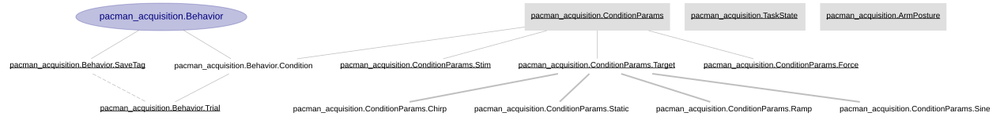

In [37]:
dj.ERD(pacman_acquisition)

In [39]:
ramp_conditions = pacman_acquisition.ConditionParams.Target * pacman_acquisition.ConditionParams.Ramp
ramp_conditions

condition_id condition ID number,target_id target ID number,target_duration target duration (s),target_offset target offset from baseline (proportion playable window),"target_pad_pre duration of ""padding"" dots preceding target force profile (s)","target_pad_post duration of ""padding"" dots following target force profile (s)",target_amplitude target amplitude (proportion playable window)
0,0,4.0000,0.0000,0.7000,0.7000,1.0000
6,6,0.2500,0.0000,0.7000,0.7000,1.0000
7,7,0.2500,1.0000,0.7000,0.7000,-1.0000
11,9,4.0000,1.0000,0.7000,0.7000,-1.0000


In [40]:
# compute ramp slope
ramp_conditions.proj(slope='target_amplitude / target_duration')

condition_id condition ID number,target_id target ID number,slope calculated attribute
0,0,0.25000000
6,6,4.00000000
7,7,-4.00000000
11,9,-0.25000000


In [41]:
# merge slope with original table
ramp_conditions * ramp_conditions.proj(slope='target_amplitude / target_duration')

condition_id condition ID number,target_id target ID number,target_duration target duration (s),target_offset target offset from baseline (proportion playable window),"target_pad_pre duration of ""padding"" dots preceding target force profile (s)","target_pad_post duration of ""padding"" dots following target force profile (s)",target_amplitude target amplitude (proportion playable window),slope calculated attribute
0,0,4.0000,0.0000,0.7000,0.7000,1.0000,0.25000000
6,6,0.2500,0.0000,0.7000,0.7000,1.0000,4.00000000
7,7,0.2500,1.0000,0.7000,0.7000,-1.0000,-4.00000000
11,9,4.0000,1.0000,0.7000,0.7000,-1.0000,-0.25000000


# Universal sets

Universal sets (dj.U) defines the set of all possible entries.

Can be used to create new entity types not stored in existing tables.

In [42]:
dj.U()

In [43]:
# pacman trial table
pacman_acquisition.Behavior.Trial()

session_date session date,monkey monkey name,condition_id condition ID number,trial session trial number,save_tag save tag number,successful_trial whether the trial was successful,simulation_time task model simulation time,task_state task state IDs,force_raw_online amplified output of load cell,force_filt_online online (boxcar) filtered and normalized force used to control Pac-Man,reward TTL signal indicating the delivery of juice reward,photobox photobox signal,stim TTL signal indicating the delivery of a stim pulse
2018-04-13,Cousteau,0,1,0,1,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,2,0,1,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,29,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,32,0,0,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=,=BLOB=


In [44]:
# all unique save tags (2020-01-06)
trial_table = pacman_acquisition.Behavior.Trial & {'session_date': '2020-01-06'}
dj.U('save_tag') & trial_table

save_tag save tag number
0
1


In [46]:
# trial counts per save tag
dj.U('save_tag').aggr(trial_table, count='count(*)')

save_tag save tag number,count calculated attribute
0,3
1,947


In [47]:
# success rate per save tag
dj.U('save_tag').aggr(trial_table, success_rate='avg(successful_trial)')

save_tag save tag number,success_rate calculated attribute
0,1.0000
1,0.8226


In [48]:
# project a random ID to each trial
dj.U('trial').aggr(trial_table, rnd_id='rand()')

trial session trial number,rnd_id calculated attribute
1,0.8352340532794912
2,0.7520338648483472
3,0.2544671951369077
4,0.8370092397900384


In [98]:
# fetch a random trial key
(trial_table * dj.U('trial').aggr(trial_table, rnd_id='rand()')).fetch('KEY', limit=1, order_by='rnd_id')

[{'session_date': datetime.date(2020, 1, 6),
  'monkey': 'Cousteau',
  'condition_id': 183,
  'trial': 416}]

# Visualization

## dataviz

In [52]:
from churchland_pipeline_python.utilities import dataviz

In [53]:
# single-trial forces
pacman_behavior.Force()

session_date session date,monkey monkey name,condition_id condition ID number,trial session trial number,alignment_params_id alignment params ID number,filter_params_id filter params ID number,"force_raw raw (online), aligned force signal (V)","force_filt filtered, aligned, and calibrated force (N)"
2018-04-13,Cousteau,0,1,0,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,2,0,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,33,0,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,0,34,0,0,=BLOB=,=BLOB=


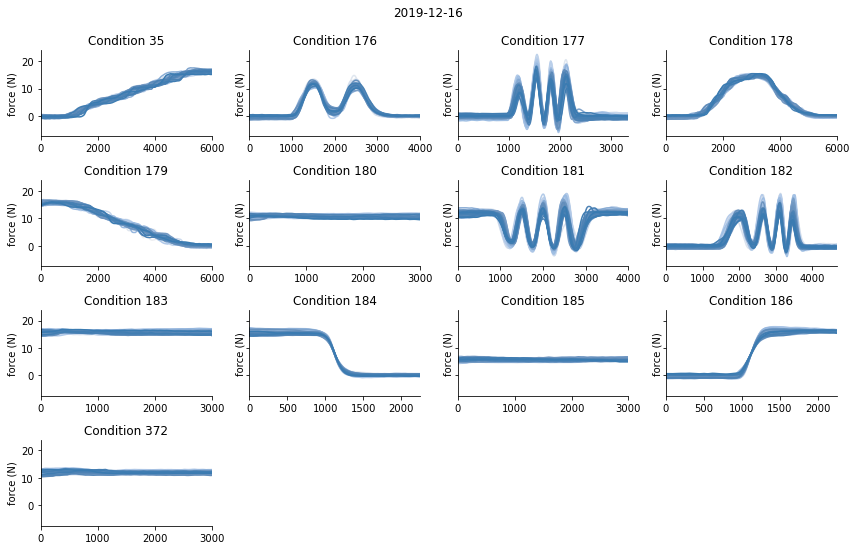

In [54]:
# plot good trial forces for 2019-12-16
# "labels" dictionary maps attributes to formatted text
session_key = {'session_date': '2019-12-16'}

dataviz.plot_table(
    pacman_behavior.Force
        & session_key
        & (pacman_processing.GoodTrial & 'good_trial'),
    y='force_filt', 
    group_by=('condition_id',), 
    stack_by=('trial',),
    axes=dict(sharey=True), 
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', force_filt='force (N)')
)

In [55]:
# each condition has a time vector and target force profile, constructed using the sample rate from that session
# note that there are many more force entries than condition entries, but the tables can still be joined to associate the behavior with the trial time
pacman_acquisition.Behavior.Condition()

session_date session date,monkey monkey name,condition_id condition ID number,condition_time condition time vector (s),condition_force condition force profile (N)
2018-04-13,Cousteau,0,=BLOB=,=BLOB=
2018-04-20,Cousteau,0,=BLOB=,=BLOB=
2018-04-13,Cousteau,1,=BLOB=,=BLOB=
2018-04-20,Cousteau,1,=BLOB=,=BLOB=


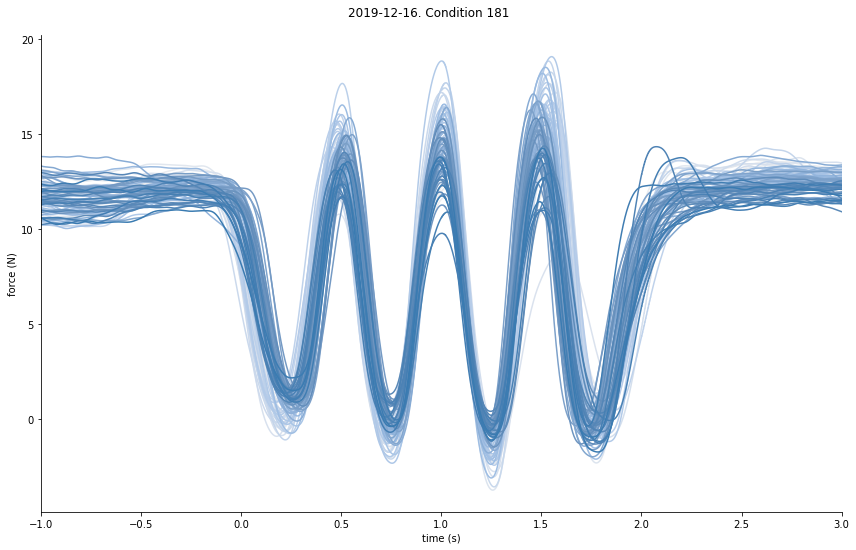

In [56]:
# plot trials for 2 Hz sinusoid
# join with Condition table to plot actual condition time
dataviz.plot_table(
    pacman_behavior.Force * pacman_acquisition.Behavior.Condition
        & session_key
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial'),
    y='force_filt', 
    x='condition_time', 
    stack_by=('trial',),
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', force_filt='force (N)', condition_time='time (s)')
)

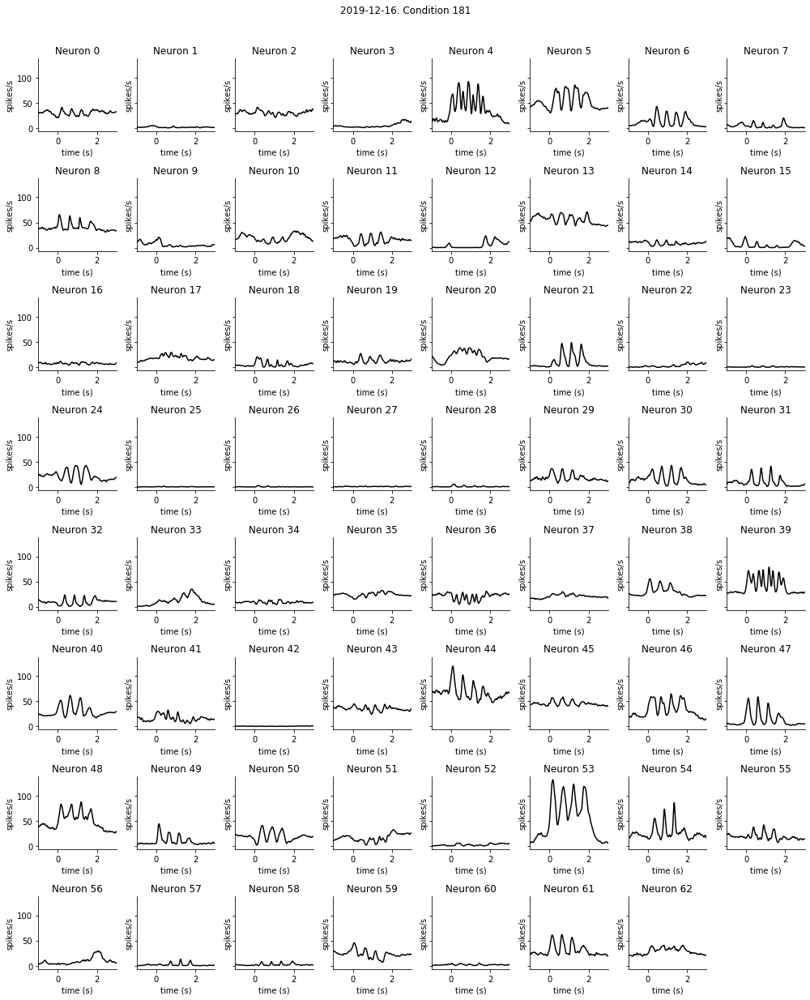

In [57]:
# plot neuron PSTHs for 2 Hz sinusoid
# set color to black for all traces
# note figures/subplots/lines autolimited; can be overriden
dataviz.plot_table(
    pacman_brain.NeuronPsth * pacman_acquisition.Behavior.Condition
        & session_key
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial'),
    y='neuron_psth', 
    x='condition_time', 
    group_by=('neuron_id',),
    axes=dict(sharey=True), 
    style=dict(color='k'), 
    layout=dict(limit_subplots=None, figsize=(14,18)),
    labels=dict(session_date=r'{}', condition_id=r'Condition {}', neuron_psth='spikes/s', neuron_id='Neuron {}', condition_time='time (s)')
)

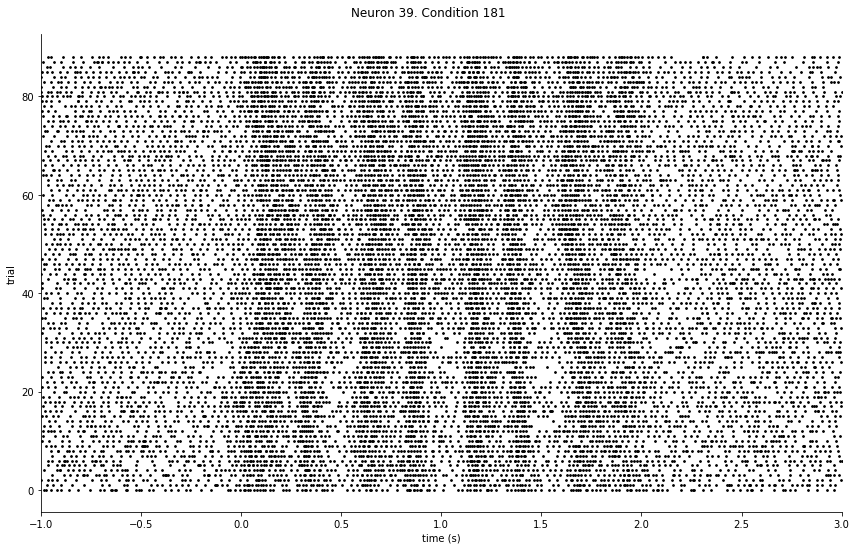

In [58]:
# plot spike raster for neuron 39 (40th neuron -- 0 indexing) from 2 Hz sinusoidal condition from 2019-12-16
dataviz.plot_table(
    pacman_brain.NeuronSpikeRaster * pacman_acquisition.Behavior.Condition
        & session_key
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial')
        & {'neuron_id': 39},
    y='neuron_spike_raster', 
    x='condition_time', 
    stack_by=('trial',),
    style=dict(kind='raster', color='k'),
    labels=dict(session_id=r'Session {}', condition_id=r'Condition {}', neuron_spike_raster='trial', neuron_id='Neuron {}', condition_time='time (s)')
)

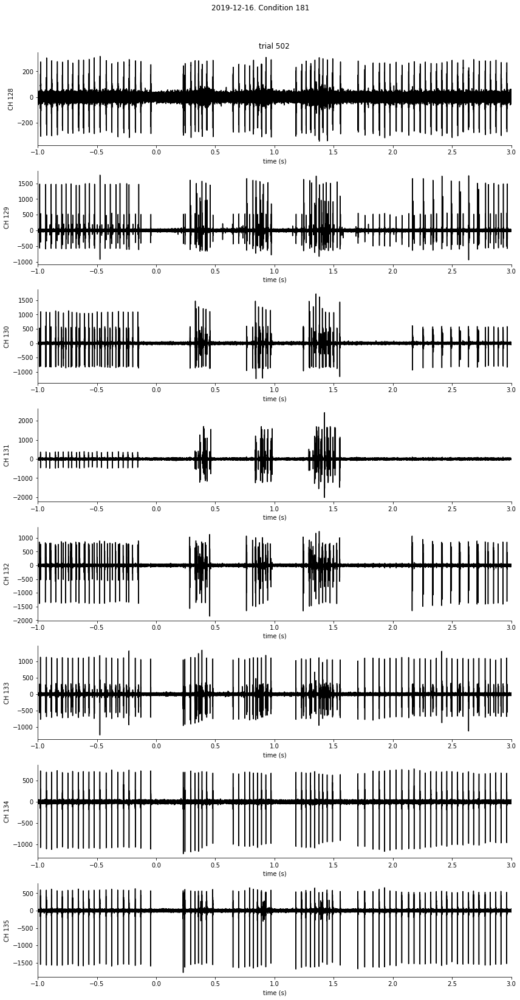

In [59]:
# plot random EMG trial
# map highpass Butterworth to y-data
emg_table = pacman_muscle.Emg * pacman_acquisition.Behavior.Condition \
    & session_key \
    & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2}) \
    & (pacman_processing.GoodTrial & 'good_trial')

trial_key = dj.U('trial').aggr(emg_table, rnd_id='rand()').fetch('KEY', order_by='rnd_id', limit=1)

butter_hp500 = (processing.Filter.Butterworth & {'low_cut': 500}).filt

dataviz.plot_table(emg_table & trial_key,
    y='emg_signal', 
    x='condition_time', 
    map_fcn=butter_hp500, 
    map_args=(3e4,),
    style=dict(color='k'), 
    layout=dict(grid_attr=('ephys_channel_idx','trial'), figsize=(12,24)),
    labels=dict(
        session_date=r'{}', 
        condition_id=r'Condition {}', 
        trial='trial {}', 
        ephys_channel_idx='CH {}', 
        condition_time='time (s)'
    )
)

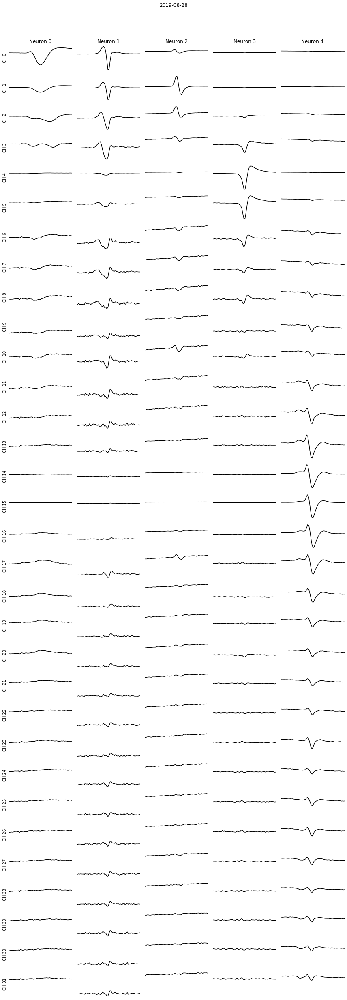

In [60]:
# try plotting a few templates from an S-Probe day
# note we ignore the ephys_channel_idx attribute here since we've joined with the electrode array model 
# and use the electrode_idx (sorted by physical position on the probe) to set the layout
s_probe_session_key = dj.U('session_date') \
    .aggr(acquisition.BrainChannelGroup & {'electrode_array_model': 'S-Probe'}, rnd_id='rand()') \
    .fetch('KEY', limit=1, order_by='rnd_id')

neuron_keys = dj.U(*processing.Neuron.primary_key) \
    .aggr(processing.Neuron & s_probe_session_key, rnd_id='rand()') \
    .fetch('KEY', limit=5, order_by='rnd_id')

dataviz.plot_table(
    processing.Neuron.Template * acquisition.BrainChannelGroup * equipment.ElectrodeArrayConfig.Electrode \
        & neuron_keys,
    y='neuron_template', 
    ignore=('ephys_channel_idx',),
    axes=dict(sharey='row'),
    style=dict(color='k', remove_spines=('top','right','bottom','left'), show_x_ticks=False, show_y_ticks=False),
    layout=dict(grid_attr=('electrode_idx', 'neuron_id'), figsize=(12,36)),
    labels=dict(session_date=r'{}', electrode_idx=r'CH {}', neuron_id=r'Neuron {}')
)

A word about git...

(checkout dataviz)

In [74]:
import numpy as np
import colorcet as cc

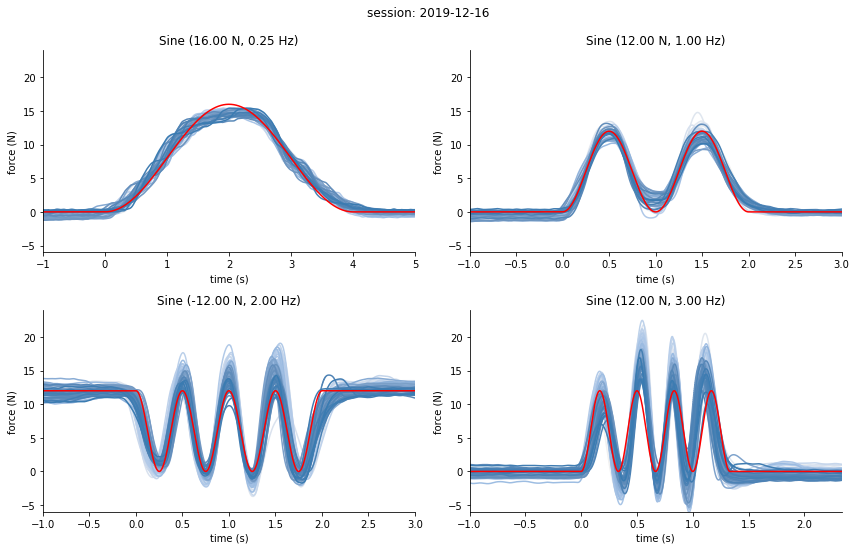

In [72]:
# plot target forces overlaid on trial forces
dataviz.plot_table(
    pacman_behavior.Force * pacman_acquisition.Behavior.Condition
        * pacman_acquisition.ConditionParams().proj_label(n_sigfigs=2)
        * pacman_acquisition.ConditionParams().proj_rank()
        & session_key
        & pacman_acquisition.ConditionParams.Sine
        & (pacman_processing.GoodTrial & 'good_trial')
    ,
    y_attributes=['force_filt', 'condition_force'],
    x_attributes='condition_time',
    group_by='condition_id',
    stack_by='trial',
    order_by='condition_rank',
    axes=[
        dataviz.Axis(
            labels=dict(
                force_filt='force (N)'
            )
        ),
        dataviz.Axis(
            y_lim=(-6,24),
            color_map='r',
            map_fcn=np.unique,
            map_kwargs=dict(axis=0),
            labels=dict(
                condition_label=r'{}',
                condition_time='time (s)',
                session_date=r'session: {}',
            )
        )
    ],
    layout=dataviz.Layout(
        figsize=(12,8),
        y_attribute_coords=np.array([(0,0,0), (0,0,1)]),
    )
)

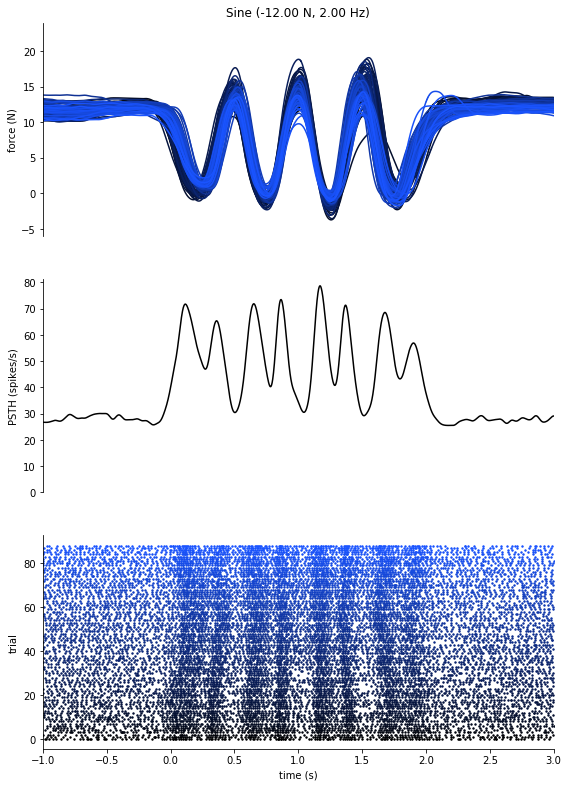

In [76]:
# plot forces, spikes, and average firing rates for one neuron and condition, vertically stacked
dataviz.plot_table(
    pacman_behavior.Force * pacman_brain.NeuronRate * pacman_brain.NeuronSpikeRaster
        * pacman_acquisition.Behavior.Condition
        * pacman_acquisition.ConditionParams().proj_label(n_sigfigs=2)
        * pacman_acquisition.ConditionParams().proj_rank()
        & session_key
        & {'neuron_id': 39}
        & (pacman_acquisition.ConditionParams.Sine & {'target_frequency': 2})
        & (pacman_processing.GoodTrial & 'good_trial')
    ,
    y_attributes=['force_filt', 'neuron_rate', 'neuron_spike_raster'],
    x_attributes='condition_time',
    group_by='condition_id',
    stack_by='trial',
    order_by='condition_rank',
    axes=[
        dataviz.Axis(
            color_map=cc.linear_ternary_blue_0_44_c57,
            spines=['left'],
            y_lim=(-6,24),
            x_ticks='off',
            labels=dict(
                condition_label=r'{}',
                force_filt='force (N)'
            ),
        ),
        dataviz.Axis(
            spines=['left'],
            sharey=True,
            y_lim=(0,None),
            x_ticks='off',
            color_map=cc.linear_ternary_blue_0_44_c57,
            map_fcn=np.mean,
            map_kwargs=dict(axis=0, keepdims=True),
            labels=dict(
                neuron_rate='PSTH (spikes/s)',
            ),
        ),
        dataviz.Axis(
            kind='raster',
            marker_size=2,
            color_map=cc.linear_ternary_blue_0_44_c57,
            labels=dict(
                condition_time='time (s)',
                neuron_spike_raster='trial',
            ),
        ),
    ],
    layout=dataviz.Layout(
        figsize=(8,12),
        y_attribute_coords=np.array([(0,0,0), (1,0,0), (2,0,0)]),
    )
)

## Plotly (interactive plots)

In [77]:
import plotly.express as px
import plotly.graph_objects as go

In [78]:
# plotly express provides out of the box interactive plots
fs = int(1e3)
t = np.linspace(0, 1, 1+fs)
y1 = np.cos(2*np.pi*t)
px.line(x=t, y=y1)

In [79]:
# enable/disable figure elements via legend (and compare data on hover!)
y2 = np.sin(2*np.pi*t)

fig = go.Figure()
fig.add_trace(go.Scatter(x=t, y=y1, name='cos'))
fig.add_trace(go.Scatter(x=t, y=y2, name='sin'))
fig.show()

checkout pacman visualization

In [82]:
# sample dash app
pacman_brain.NeuronPsth().dash_app(mode='external')

Dash app running on http://127.0.0.1:8050/


In [83]:
from njm2149_pipeline_python.pacman import neural_manifold

In [84]:
X, condition_ids, condition_times, condition_keys, neuron_keys = pacman_brain.NeuronPsth().fetch_psths()

In [92]:
X_norm = (X - X.mean(axis=1, keepdims=True)) / X.ptp(axis=1, keepdims=True)

In [99]:
neural_manifold.plot_neural_state(X_norm, condition_ids, condition_keys, pc_condition_set_name='dynamic_12', component_ids=(0,1,2));

# Computation (?)

e.g. spike statistics, spike-triggered average, tangling